In [1]:
# boilerplate sanity check
import os,warnings,cpuinfo,multiprocessing,psutil,sys
warnings.simplefilter(action='ignore',category=FutureWarning)
try:cpu=cpuinfo.get_cpu_info();print('CPU says hello!\n-name: {}\n-architecture: {}\n-bits: {}\n-frequency: {}\n-threads: {}\n-l3_cache: {}\n-l2_cache: {}\n-l1_cache: {}'.format(cpu['brand'],cpu['arch'],cpu['bits'],cpu['hz_actual'],multiprocessing.cpu_count(),cpu['l3_cache_size'],cpu['l2_cache_size'],cpu['l1_data_cache_size']))
except:print('Failed to get all CPU info!')
try:print('RAM says hello!\n-virtual: {} GB\n-swap: {} GB'.format(round(psutil.virtual_memory().total/1024**3,2),round(psutil.swap_memory().total/1024**3,2)))
except:print('Failed to get all RAM info!')
print('Python says hello!\n-python: {}'.format(sys.version.split(' ')[0]))

CPU says hello!
-name: Intel(R) Core(TM) i7-7700HQ CPU @ 2.80GHz
-architecture: X86_64
-bits: 64
-frequency: 3.5906 GHz
-threads: 8
-l3_cache: 6144 KB
-l2_cache: 1 MiB
-l1_cache: 128 KiB
RAM says hello!
-virtual: 30.93 GB
-swap: 0.95 GB
Python says hello!
-python: 3.9.19


In [2]:
import os
import re
import gc
import sys
import math
import numpy as np
import cv2 as cv2
import matplotlib.pyplot as plt
import multiprocessing
import SimpleITK as sitk
from radiomics import featureextractor
import psutil
import time

np.seterr(over='ignore',under='ignore')

def poolWrapper(f, d):
    with multiprocessing.Pool(multiprocessing.cpu_count()) as pool:
        res = pool.map(f, d)
    return res

In [3]:
def centerSlices(data, data2=None, blend=0.5, slices=None):
    #slice off first dim if multiple datapoints are passed
    if len(data.shape) == 5:
        data = data[0,:,:,:,:]
    #slice off last dimension
    if len(data.shape) == 4:
        data = data[:,:,:,0]
    #if exact XYZ slices are not defined, get the center from XY and 2/3 from Z
    if slices is None:
        slices = [data.shape[0]//2,data.shape[1]//2,2*data.shape[2]//3]
    #display slices
    if data2 is None:
        plt.imshow(data[slices[0],:,:])
        plt.show()
        plt.imshow(data[:,slices[1],:])
        plt.show()
        plt.imshow(data[:,:,slices[2]])
        plt.show()
    #display overlayed slices
    else:
        #slice off first dim if multiple datapoints are passed
        if len(data2.shape) == 5:
            data2 = data2[0,:,:,:,:]
        #slice off last dimension
        if len(data2.shape) == 4:
            data2 = data2[:,:,:,0]
        #fix opencv datatype requirement
        if data.dtype == np.float16:
            data = np.array(data, dtype=np.float32)
        if data2.dtype == np.float16:
            data2 = np.array(data2, dtype=np.float32)
        #show blend of two images
        plt.imshow(cv2.addWeighted(data[slices[0],:,:], blend, data2[slices[0],:,:], 1-blend, 0))
        plt.show()
        plt.imshow(cv2.addWeighted(data[:,slices[1],:], blend, data2[:,slices[1],:], 1-blend, 0))
        plt.show()
        plt.imshow(cv2.addWeighted(data[:,:,slices[2]], blend, data2[:,:,slices[2]], 1-blend, 0))
        plt.show()

def printProperties(data):
    print(data.shape)
    print(data.dtype)
    data = data[0]
    d0 = data
    while np.prod(np.array(data.shape)) > 100000000:
        t = data
        for i in range(len(data.shape)):
            t = t.take(indices=range(0,data.shape[i]//2),axis=i)
        data = t
    u,c = np.unique(data,return_counts=True)
    cnt = dict(zip(u,c))
    if (len(cnt) > 10):
        print('MANY! '+str(np.min(d0))+'-'+str(np.max(d0)))
    else:
        print(cnt)

In [4]:
t1      = np.load('data/preprocessed/t1.npy')
t1_mask = np.load('data/preprocessed/t1_mask.npy')
print('Records: {}\nRAM:     {}GB\n================='.format(len(t1),round(psutil.Process().memory_info().rss/1024**3,1)))
for d in [t1,t1_mask]:
    printProperties(d)

Records: 1
RAM:     0.2GB
(1, 150, 186, 124, 1)
float16


MANY! 0.0-629.0
(1, 150, 186, 124, 1)
bool
{False: 1921304, True: 1538296}


In [5]:
extractor_params = {
    "voxelSetting": {
        "kernelRadius": 2,
        "maskedKernel": True,
    },
    "setting": {
        "binWidth": 25,
        "label": 1,
        "interpolator": "sitkBSpline",
        "resampledPixelSpacing": None,
        "weightingNorm": None,
    },
    "imageType": {
        "Original": {},
    },
    "featureClass": {
        "firstorder": [
            "Energy",
            "TotalEnergy",
            "Entropy",
            "Minimum",
            "10Percentile",
            "90Percentile",
            "Maximum",
            "Mean",
            "Median",
            "InterquartileRange",
            "Range",
            "MeanAbsoluteDeviation",
            "RobustMeanAbsoluteDeviation",
            "RootMeanSquared",
            "Skewness",
            "Kurtosis",
            "Variance",
            "Uniformity",
        ],
        "glcm": [
            "Autocorrelation",
            "JointAverage",
            "ClusterProminence",
            "ClusterShade",
            "ClusterTendency",
            "Contrast",
            "Correlation",
            "DifferenceAverage",
            "DifferenceEntropy",
            "DifferenceVariance",
            "JointEnergy",
            "JointEntropy",
            "Imc1",
            "Imc2",
            "Idm",
            "MCC",
            "Idmn",
            "Id",
            "Idn",
            "InverseVariance",
            "MaximumProbability",
            #"SumAverage", # When GLCM is symmetrical, μx=μy, and therefore Sum Average=μx+μy=2μx=2∗JointAverage.
            "SumEntropy",
            "SumSquares",
        ],
        "glszm": [
            "SmallAreaEmphasis",
            "LargeAreaEmphasis",
            "GrayLevelNonUniformity",
            "GrayLevelNonUniformityNormalized",
            "SizeZoneNonUniformity",
            "SizeZoneNonUniformityNormalized",
            "ZonePercentage",
            "GrayLevelVariance",
            "ZoneVariance",
            "ZoneEntropy",
            "LowGrayLevelZoneEmphasis",
            "HighGrayLevelZoneEmphasis",
            "SmallAreaLowGrayLevelEmphasis",
            "SmallAreaHighGrayLevelEmphasis",
            "LargeAreaLowGrayLevelEmphasis",
            "LargeAreaHighGrayLevelEmphasis",
        ],
        "glrlm": [
            "ShortRunEmphasis",
            "LongRunEmphasis",
            "GrayLevelNonUniformity",
            "GrayLevelNonUniformityNormalized",
            "RunLengthNonUniformity",
            "RunLengthNonUniformityNormalized",
            "RunPercentage",
            "GrayLevelVariance",
            "RunVariance",
            "RunEntropy",
            "LowGrayLevelRunEmphasis",
            "HighGrayLevelRunEmphasis",
            "ShortRunLowGrayLevelEmphasis",
            "ShortRunHighGrayLevelEmphasis",
            "LongRunLowGrayLevelEmphasis",
            "LongRunHighGrayLevelEmphasis",
        ],
        "ngtdm": [
            "Coarseness",
            "Contrast",
            "Busyness",
            "Complexity",
            "Strength",
        ],
        "gldm": [
            "SmallDependenceEmphasis",
            "LargeDependenceEmphasis",
            "GrayLevelNonUniformity",
            "DependenceNonUniformity",
            "DependenceNonUniformityNormalized",
            "GrayLevelVariance",
            "DependenceVariance",
            "DependenceEntropy",
            "LowGrayLevelEmphasis",
            "HighGrayLevelEmphasis",
            "SmallDependenceLowGrayLevelEmphasis",
            "SmallDependenceHighGrayLevelEmphasis",
            "LargeDependenceLowGrayLevelEmphasis",
            "LargeDependenceHighGrayLevelEmphasis",
        ],
        "shape": [
            "MeshVolume",
            "VoxelVolume",
            "SurfaceArea",
            "SurfaceVolumeRatio",
            "Sphericity",
            "Maximum3DDiameter",
            "Maximum2DDiameterSlice",
            "Maximum2DDiameterColumn",
            "Maximum2DDiameterRow",
            "MajorAxisLength",
            "MinorAxisLength",
            "LeastAxisLength",
            "Elongation",
            "Flatness",
        ],
    },
}
#firstorder 280s
#glcm       2470s
#1-4   10**5 1200s(20m)
    #1-2   10**5  372s (5m)     ???
    #3-4   10**5  1349s (22m)
        #3 10**5  949s ()
        #4 10**5  637s (10m)    XXX
#5-8   10**5 571s (9m)          XXX
#9-13  10**5 433s (7m)          XX?
#14-18 10**5 1644s(27m)
    #14-15 10**5  488s (8m)     XX?
    #16-18 10**5  1856s(31m)
        #16 10**5 
        #17 10**5 
        #18 10**5 
#19-23 10**5 575  (9m)          XXX
#glszm      156
#glrlm      500
#ngtdm      46
#gldm       78

In [6]:
#multithreading split groups for voxel based extraction
feature_classes = ['firstorder','glcm','glszm','glrlm','ngtdm','gldm','shape']
#lower batch for certain feature classes to avoid segmentation fault
#THIS IS A BUG!!! https://github.com/AIM-Harvard/pyradiomics/issues/737
#it does not actually run out of memory!!!
feature_batches = [0           ,10**5 ,10**5  ,10**3  ,0      ,0     ,0      ]

def extractFeatures(data, mask, params, voxelBased=True):
    #slice off last dimension
    if len(data.shape)==4:
        data = data[:,:,:,0]
    if len(mask.shape)==4:
        mask = mask[:,:,:,0]
    #create feature extractor
    extractor = featureextractor.RadiomicsFeatureExtractor(params)
    extractor.disableAllFeatures()
    for c in feature_classes:
        if voxelBased and c == 'shape': continue
        if c not in params['featureClass'].keys() or len(params['featureClass'][c])==0:continue
        extractor.enableFeaturesByName(**{c:params['featureClass'][c]})
    #convert data and mask to sitk format
    sitkData = data
    if sitkData.dtype == np.float16:
        sitkData = np.array(sitkData, dtype=np.float32)
    sitkData = sitk.GetImageFromArray(sitkData)
    sitkMask = mask
    if sitkMask.dtype == np.bool_:
        sitkMask = np.array(sitkMask, dtype=np.float32)
    sitkMask = sitk.GetImageFromArray(sitkMask)
    #extract features
    result = extractor.execute(sitkData,sitkMask,voxelBased=voxelBased)
    #convert back to numpy format
    converted = []
    for c in feature_classes:
        if c in params['featureClass'].keys():
            for f in params['featureClass'][c]:
                #get radiomic feature
                r = result['original_{}_{}'.format(c,f)]
                if voxelBased:
                    #get origin from sitk format
                    o = np.flip(np.array(r.GetOrigin(),dtype=np.int32))
                    #get array from sitk format
                    r = np.array(sitk.GetArrayFromImage(r), dtype=np.float32)
                    #create empty array of original shape
                    d = np.zeros(data.shape+(1,), dtype=np.float32)
                    #paste extracted data, shifted with the origin into empty array
                    d[o[0]:o[0]+r.shape[0],o[1]:o[1]+r.shape[1],o[2]:o[2]+r.shape[2],0] = r
                    converted.append(d)
                else:
                    converted.append([r])
    #return concatenated radiomic feature images
    if not voxelBased:
        return np.expand_dims(np.concatenate(converted, axis=-1), axis=-1)
    return np.concatenate(converted, axis=-1)

def ExtractFeaturesWrapper(inp):
    if len(inp) == 3:
        data, mask, params = inp
        return extractFeatures(data, mask, params)
    data, mask, params, voxelBased = inp
    return extractFeatures(data, mask, params, voxelBased)

def extractFeaturesMulti(datas, masks, params, voxelBased=True, excludeSlow=False):
    np.seterr(invalid='ignore')
    #expand dims if neccesary
    if len(datas.shape)==3:
        datas = np.expand_dims(datas,-1)
    if len(masks.shape)==3:
        masks = np.expand_dims(masks,-1)
    if len(datas.shape)==4:
        datas = np.expand_dims(datas,0)
    if len(masks.shape)==4:
        masks = np.expand_dims(masks,0)
    #split work for multithreading
    splitted = []
    idxs = []
    #datapoint idx (loop for datapoints)
    for i in range(len(datas)):
        if voxelBased:
            #feature class idx (loop for featureclasses)
            for j in range(len(feature_classes)):
                #pass mask and data
                d = [datas[i],masks[i],None,True]
                #skip shape when voxel based
                if feature_classes[j] == 'shape': continue
                #used for quick testing
                if excludeSlow and feature_classes[j] in ['firstorder','glcm','glszm','glrlm']: continue
                #only pass parameters of one feature class per thread
                d[2] = params.copy()
                d[2]['featureClass'] = {feature_classes[j]:params['featureClass'][feature_classes[j]]}
                #if bug workaround required, include it in the parameters
                if feature_batches[j] > 0: d[2]['voxelSetting']['voxelBatch'] = feature_batches[j]
                splitted.append(d)
                #keep track if datapoint idxs
                idxs.append(i)
        else:
            #mask idx (loop for different masks)
            for j in range(masks.shape[-1]):
                d = [datas[i],masks[i,:,:,:,j],params,False]
                splitted.append(d)
                #keep track if datapoint idxs
                idxs.append(i)
    #process it multithreaded
    converted = poolWrapper(ExtractFeaturesWrapper, splitted)
    concatenated = []
    #thread idx (loop for thread return values)
    for i in range(len(idxs)):
        idx = idxs[i]
        #concatenate extracted features per image along last axis
        if len(concatenated) < idx+1:
            concatenated.append(converted[i])
        else:
            concatenated[idx] = np.concatenate([concatenated[idx],converted[i]], axis=-1)
    #return image and feature names
    features = []
    for j in range(len(feature_classes)):
        if voxelBased and feature_classes[j] == 'shape': continue
        if excludeSlow and feature_classes[j] in ['firstorder','glcm','glszm','glrlm']: continue
        for f in params['featureClass'][feature_classes[j]]:
            features.append(feature_classes[j]+'_'+f)
    np.seterr(invalid='warn')
    return [np.array(concatenated), features]

Records: 1
RAM:     1.4GB
Time:    4149s
(1, 150, 186, 124, 92)
float32


MANY! -362.42654-13979179.0


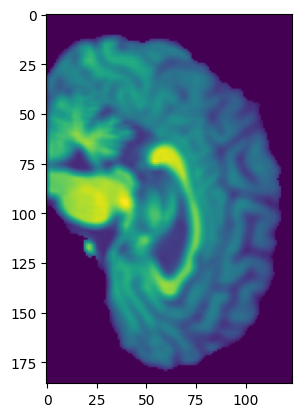

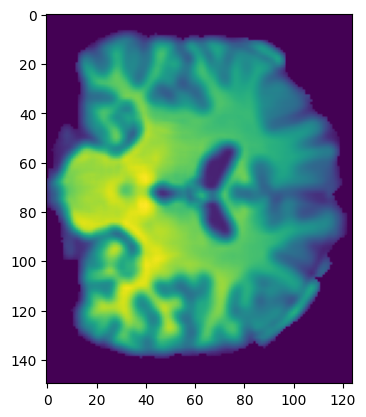

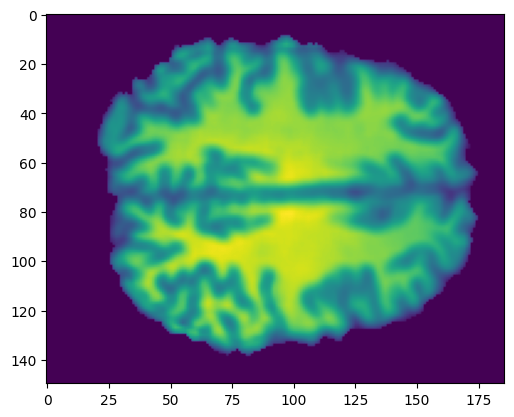

In [7]:
tmp = time.time()
radiomics, features = extractFeaturesMulti(t1, t1_mask, extractor_params, voxelBased=True, excludeSlow=False)
# radiomics = np.load('data/preprocessed/radiomics_raw.npy')
# features = np.load('data/preprocessed/radiomics_features_vox.npy')
# tmp -= 4149
#save memory
del t1
del t1_mask
#print runtime stats
print('Records: {}\nRAM:     {}GB\nTime:    {}s\n================='.format(len(radiomics),round(psutil.Process().memory_info().rss/1024**3,1),round(time.time()-tmp)))
#print output props
printProperties(radiomics)
#save output
np.save('data/preprocessed/radiomics_raw', radiomics)
np.save('data/preprocessed/radiomics_features_vox', features)
#display example slice
centerSlices(radiomics)

In [8]:
def getDistribution(data, bins=100, excludeZero=True):
    data = data.flatten()
    if excludeZero:
        data = data[data != 0]
    hist, _ = np.histogram(data,bins)
    return hist

def scaleRadiomics1(data, features):
    np.seterr(invalid='raise')
    ret = np.zeros(data.shape, dtype=np.float16)
    scaled_features = []
    for i in range(len(features)):
        d = data[:,:,:,:,i]
        min1 = np.min(d)
        max1 = np.max(d)
        var1 = np.var(d/(max1-min1))
        binMax1 = np.max(getDistribution(d))
        try:
            s = np.log10(d+1)
            min2 = np.min(s)
            max2 = np.max(s)
            var2 = np.var(s/(max2-min2))
            binMax2 = np.max(getDistribution(s))
        except:
            var2 = 0
            min2 = -1*sys.maxsize
            max2 = sys.maxsize
        if var1 < var2 and binMax1 > binMax2:
            scaled_features.append(features[i])
            d = s
            min1 = min2
            max1 = max2
        ret[:,:,:,:,i] = np.array((d-min1)/(max1-min1),dtype=np.float16)
    np.seterr(invalid='warn')
    return [ret, scaled_features]

def scaleRadiomics2(datas, features):
    data = np.concatenate(datas,axis=-1)
    ret = np.zeros(data.shape, dtype=np.float16)
    for i in range(len(features)):
        d = data[:,i,:]
        mi = np.min(d)
        ma = np.max(d)
        ret[:,i,:] = np.array((d-mi)/(ma-mi),dtype=np.float16)
    spl = []
    slc = 0
    for d in datas:
        spl.append(ret[:,:,slc:slc+d.shape[-1]])
        slc += d.shape[-1]
    return spl

In [9]:
tmp = time.time()
scaled, scaled_features = scaleRadiomics1(radiomics, features)
#print runtime stats
print('Records: {}\nRAM:     {}GB\nTime:    {}s\n================='.format(len(radiomics),round(psutil.Process().memory_info().rss/1024**3,1),round(time.time()-tmp)))
#print output props
printProperties(scaled)
#save output
np.save('data/preprocessed/radiomics_scaled', scaled)
np.save('data/preprocessed/radiomics_log10_features_vox', scaled_features)

Records: 1
RAM:     2.1GB
Time:    22s
(1, 150, 186, 124, 92)
float16


MANY! 0.0-1.0


firstorder_Energy


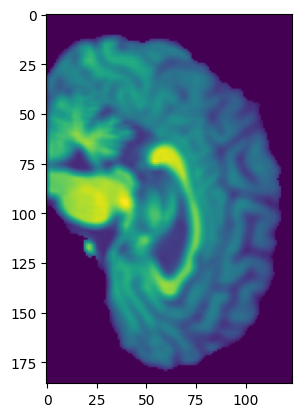

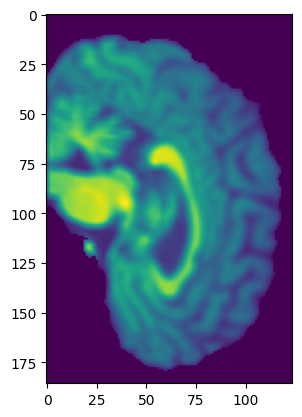

firstorder_TotalEnergy


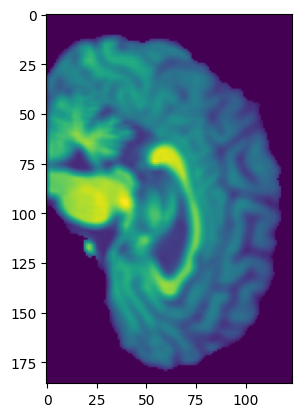

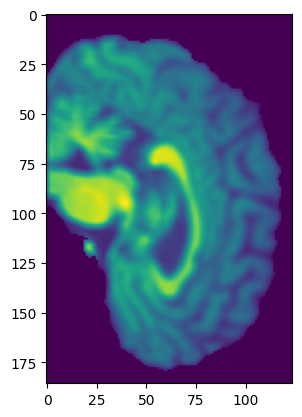

firstorder_Entropy


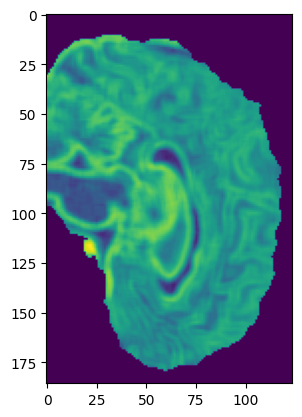

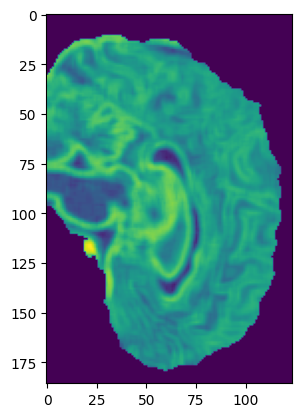

firstorder_Minimum


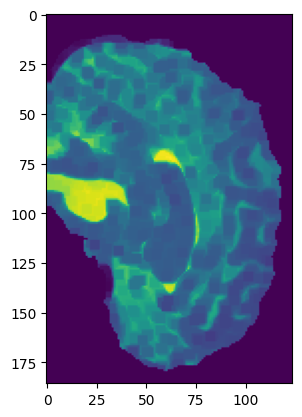

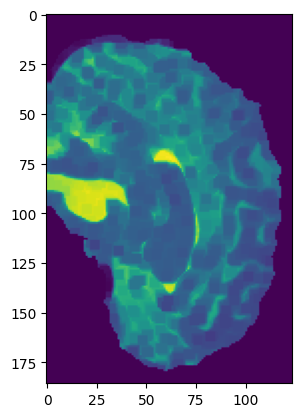

firstorder_10Percentile


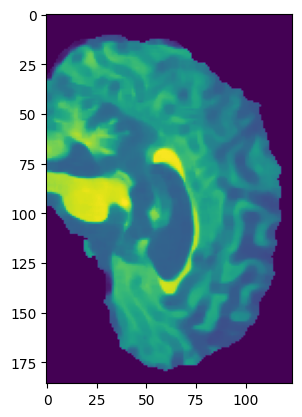

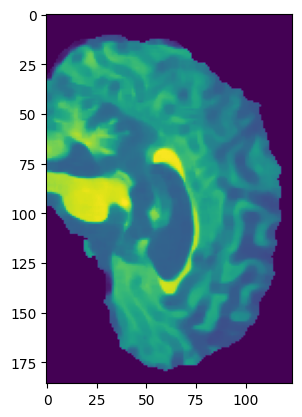

firstorder_90Percentile


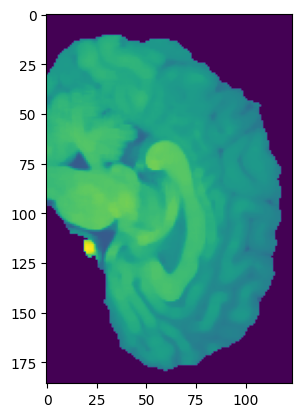

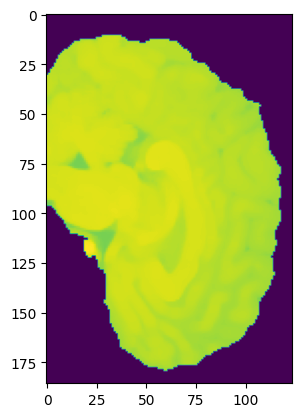

firstorder_Maximum


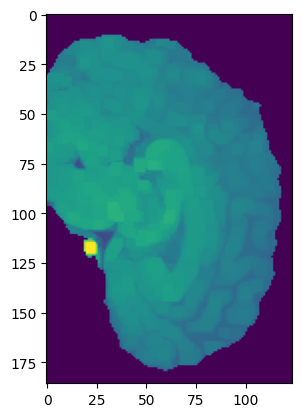

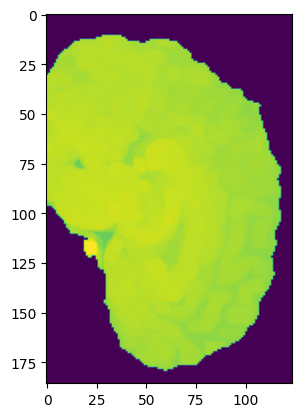

firstorder_Mean


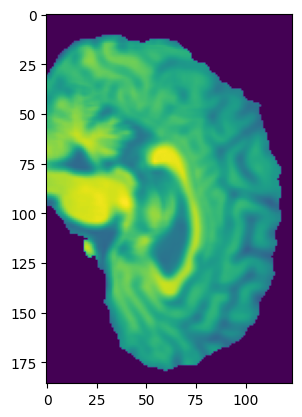

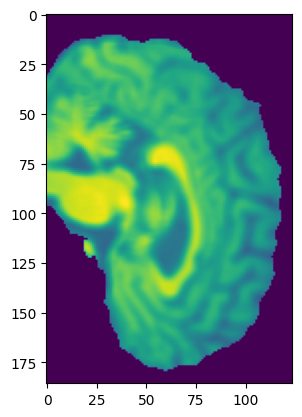

firstorder_Median


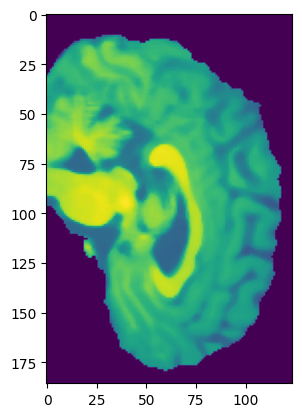

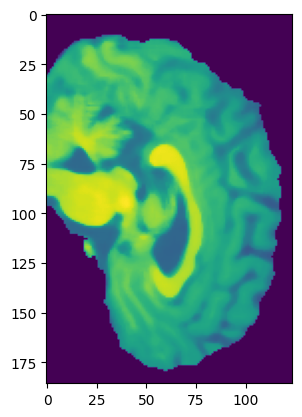

firstorder_InterquartileRange


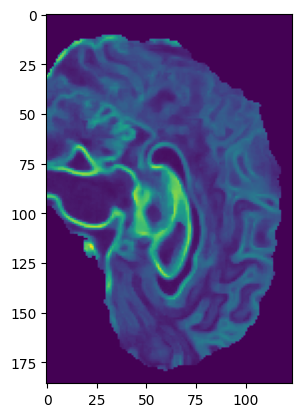

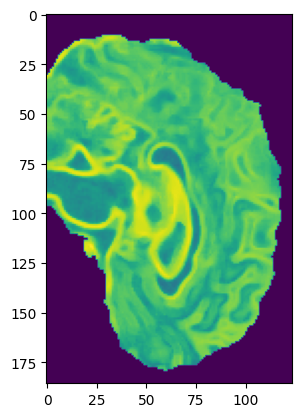

firstorder_Range


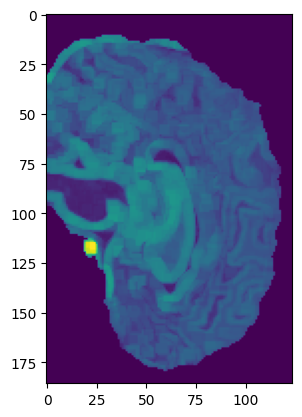

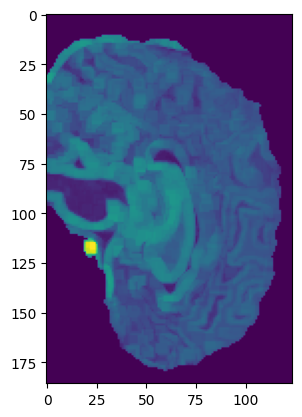

firstorder_MeanAbsoluteDeviation


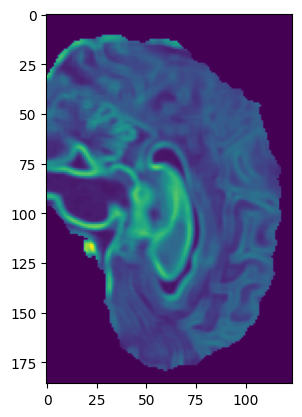

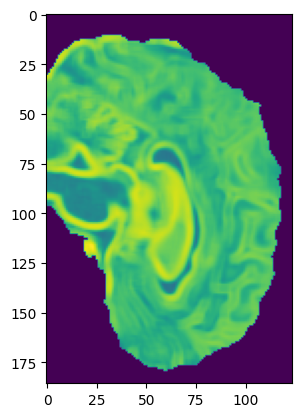

firstorder_RobustMeanAbsoluteDeviation


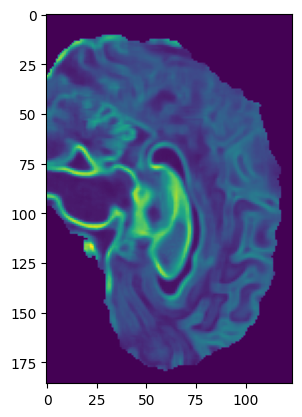

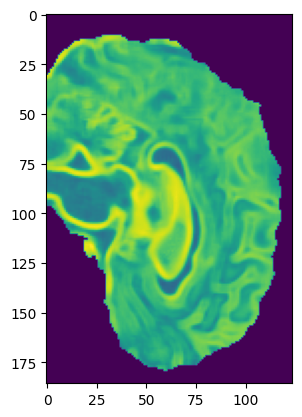

firstorder_RootMeanSquared


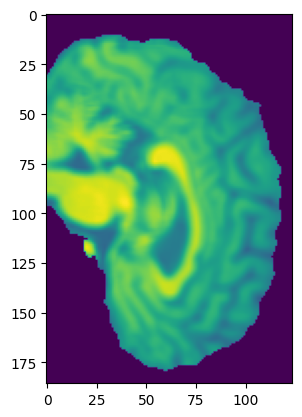

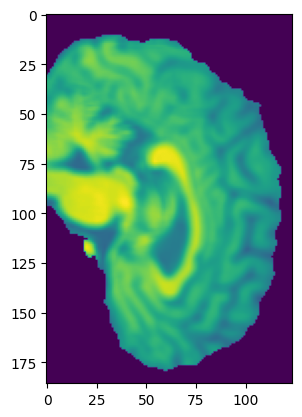

firstorder_Skewness


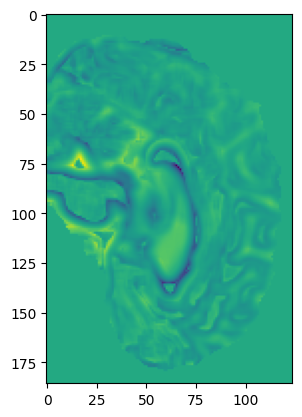

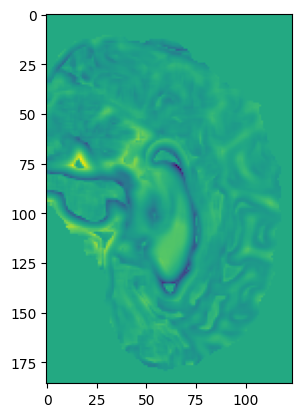

firstorder_Kurtosis


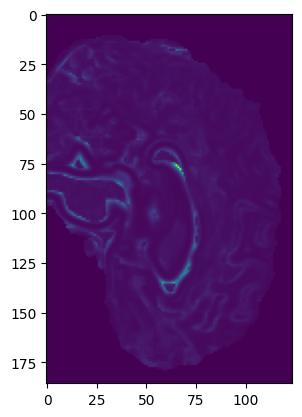

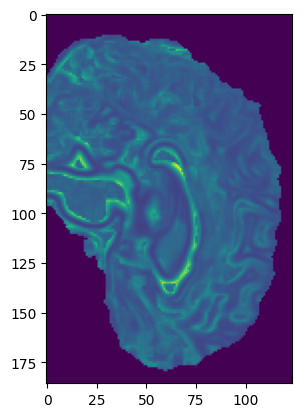

firstorder_Variance


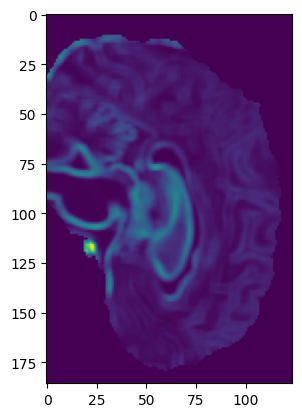

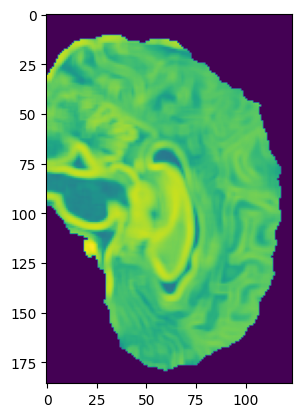

firstorder_Uniformity


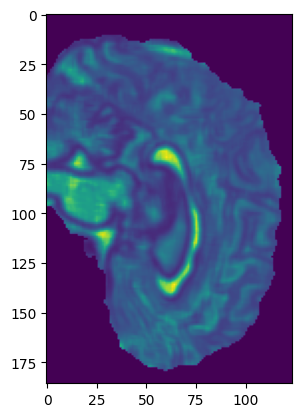

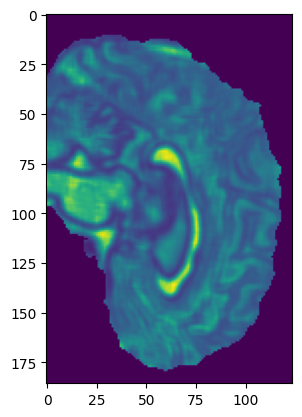

glcm_Autocorrelation


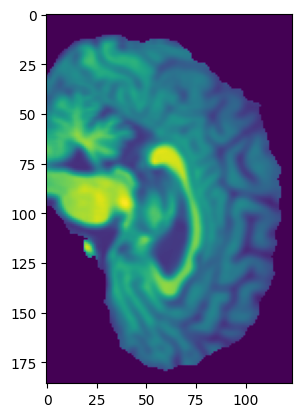

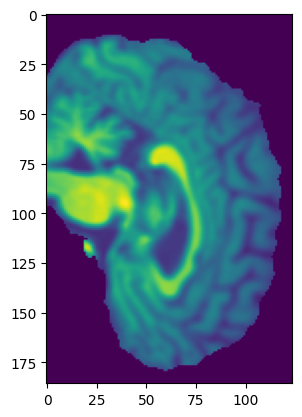

glcm_JointAverage


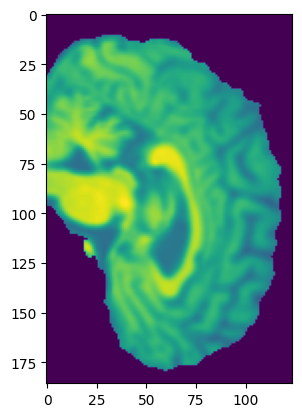

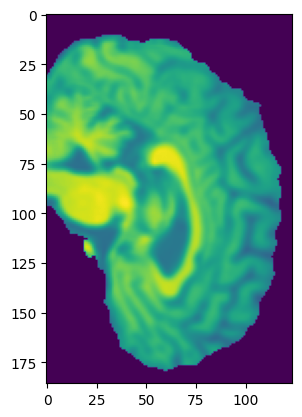

glcm_ClusterProminence


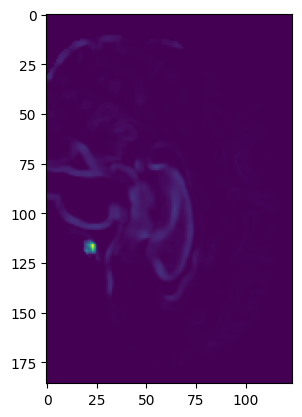

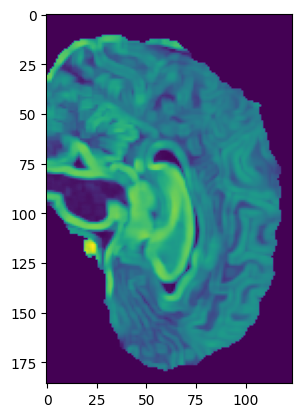

glcm_ClusterShade


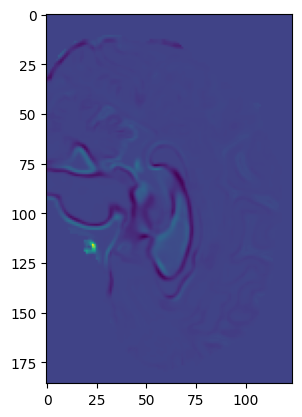

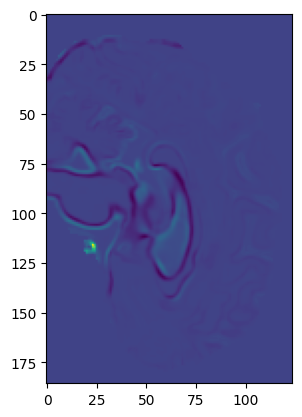

glcm_ClusterTendency


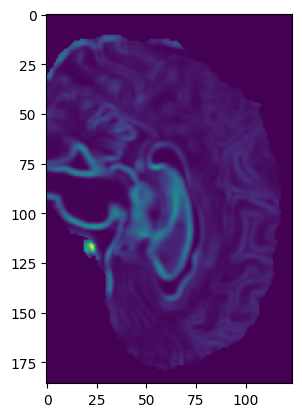

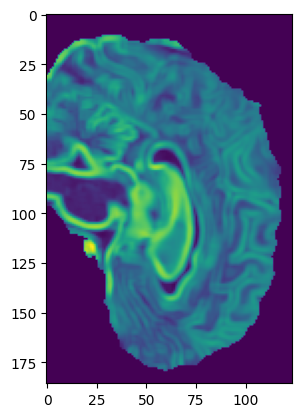

glcm_Contrast


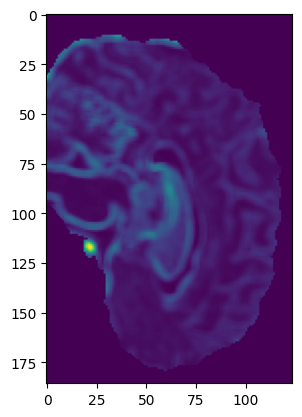

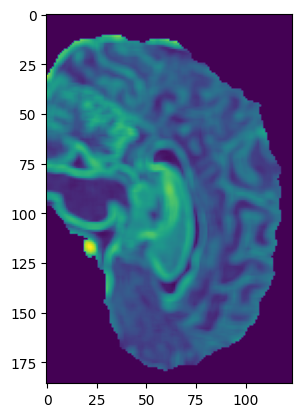

glcm_Correlation


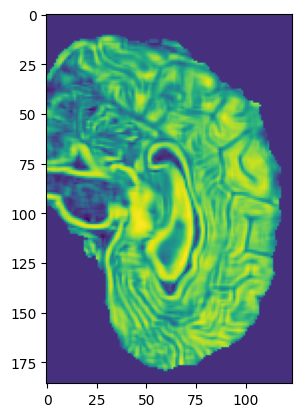

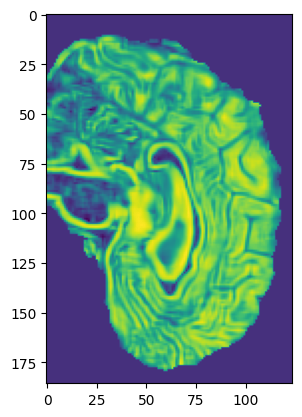

glcm_DifferenceAverage


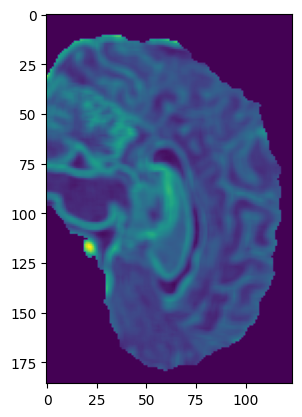

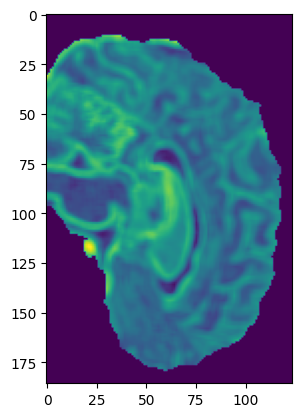

glcm_DifferenceEntropy


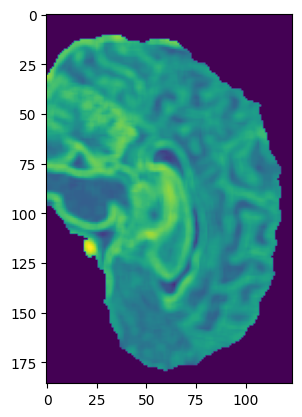

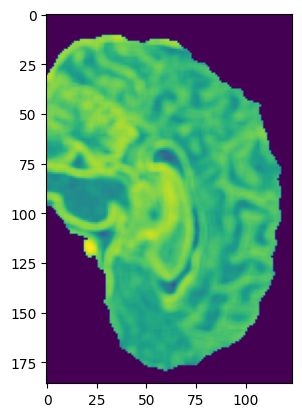

glcm_DifferenceVariance


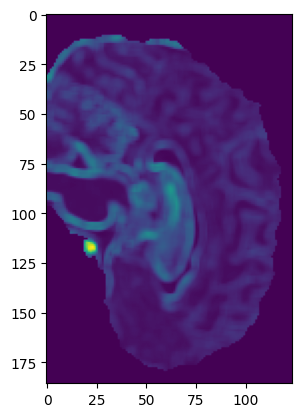

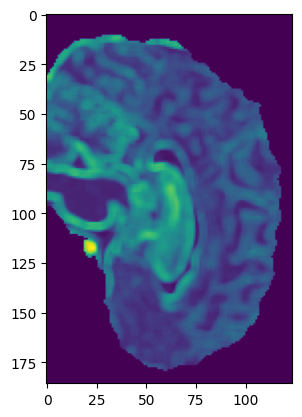

glcm_JointEnergy


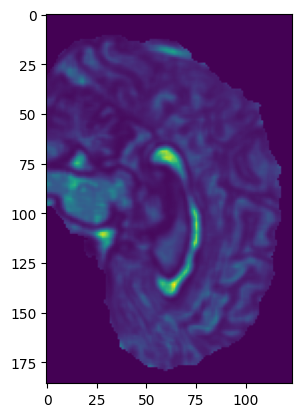

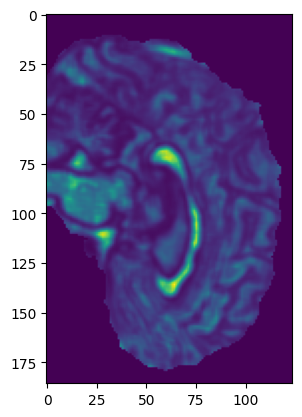

glcm_JointEntropy


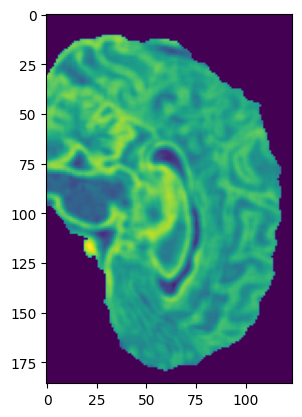

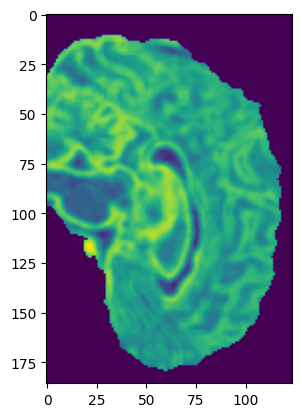

glcm_Imc1


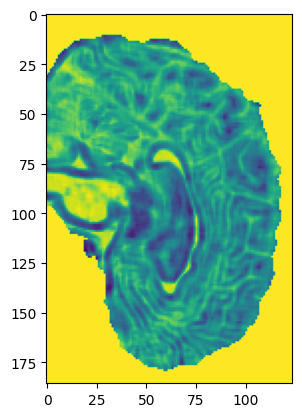

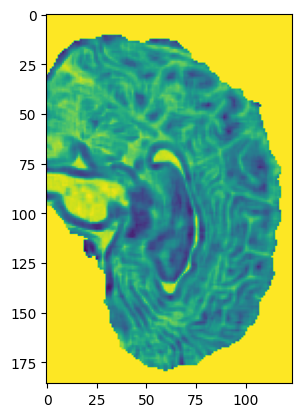

glcm_Imc2


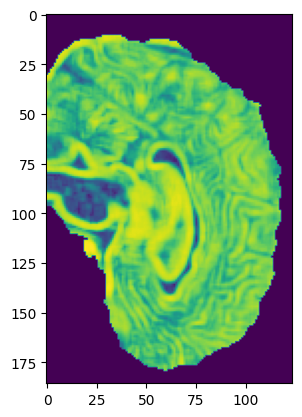

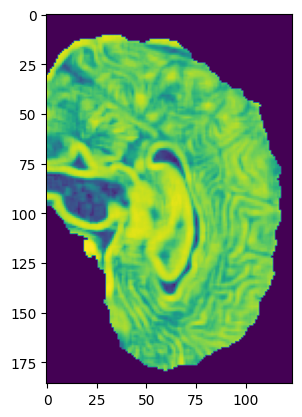

glcm_Idm


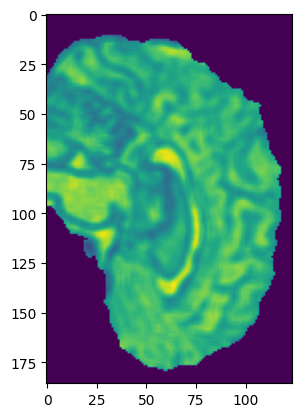

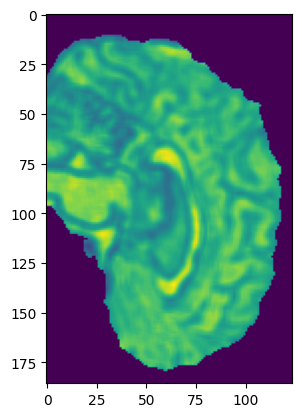

glcm_MCC


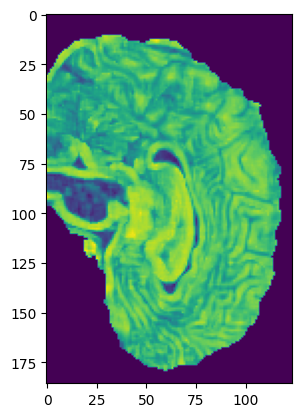

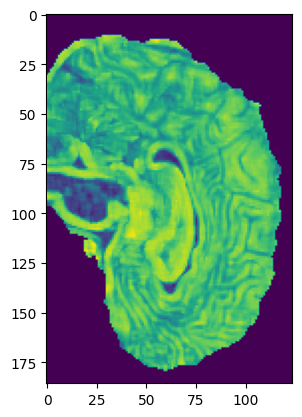

glcm_Idmn


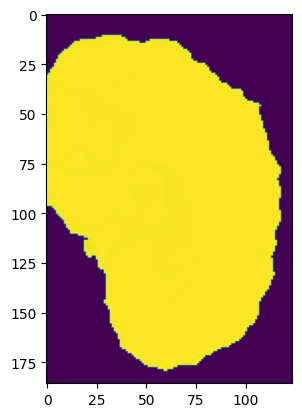

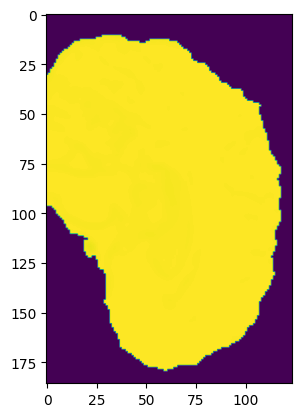

glcm_Id


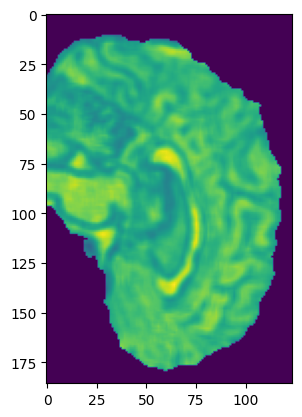

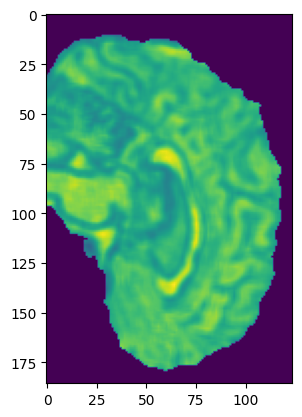

glcm_Idn


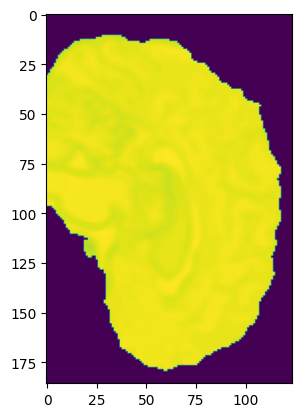

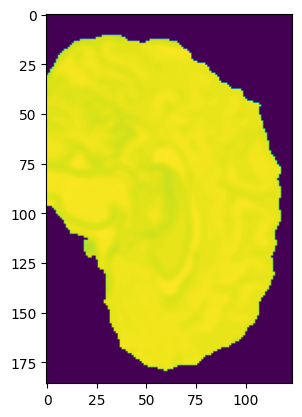

glcm_InverseVariance


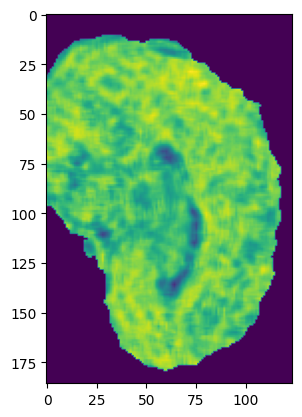

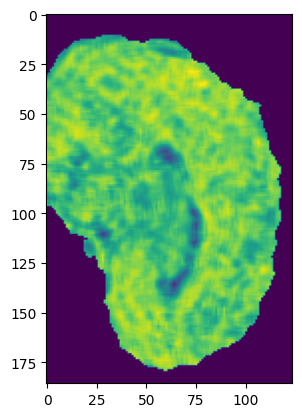

glcm_MaximumProbability


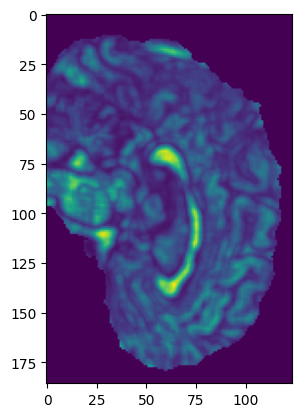

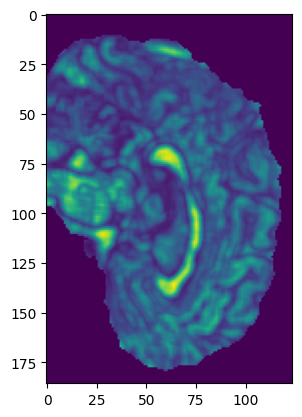

glcm_SumEntropy


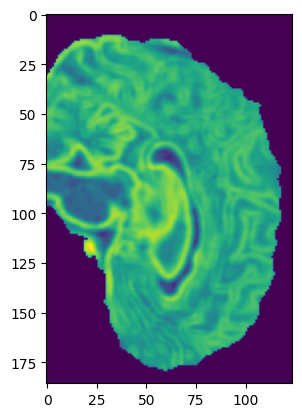

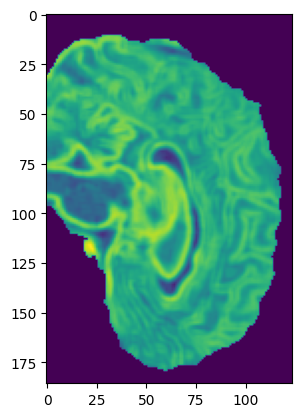

glcm_SumSquares


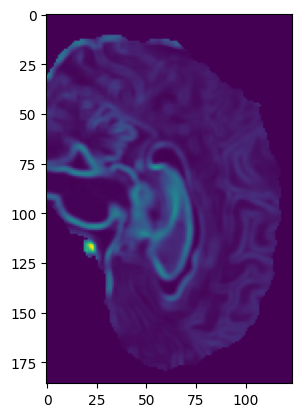

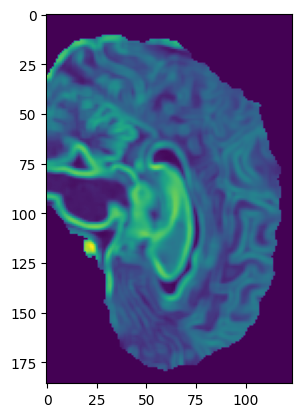

glszm_SmallAreaEmphasis


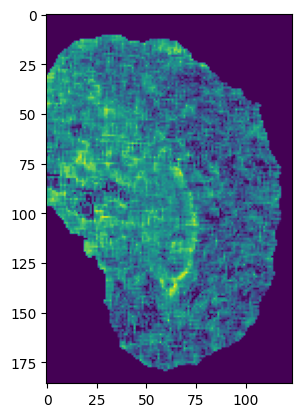

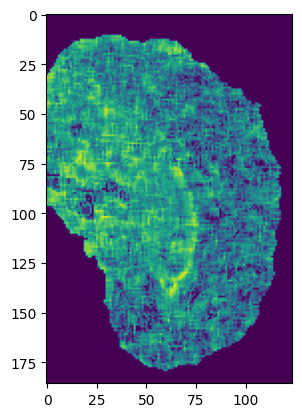

glszm_LargeAreaEmphasis


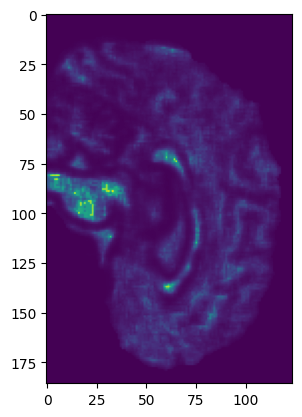

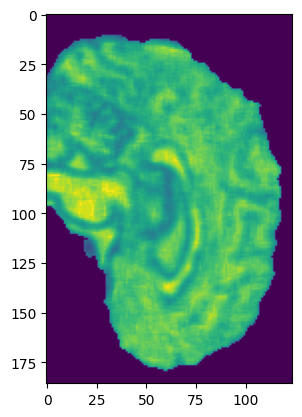

glszm_GrayLevelNonUniformity


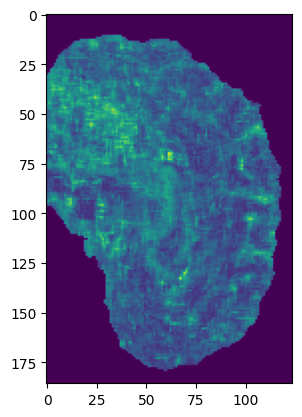

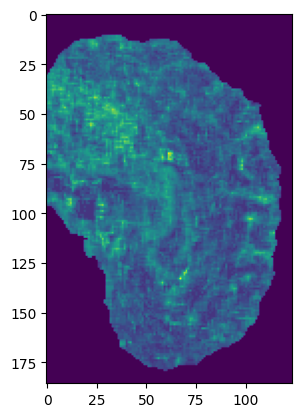

glszm_GrayLevelNonUniformityNormalized


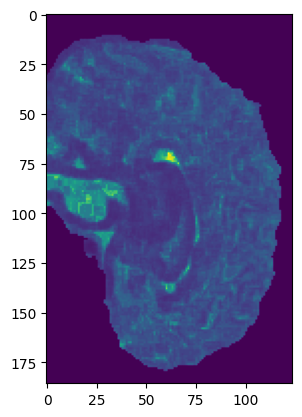

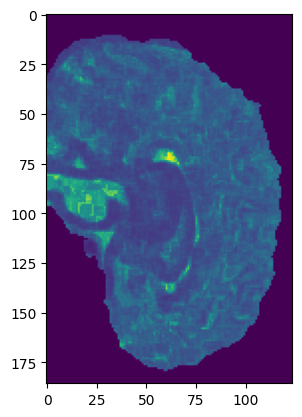

glszm_SizeZoneNonUniformity


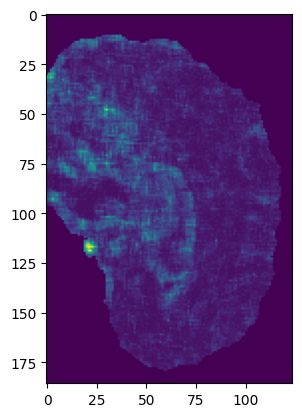

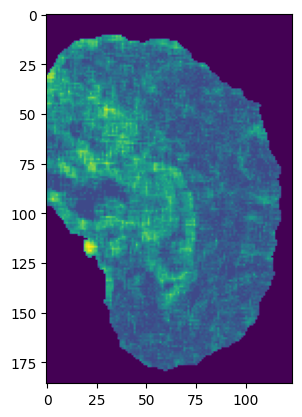

glszm_SizeZoneNonUniformityNormalized


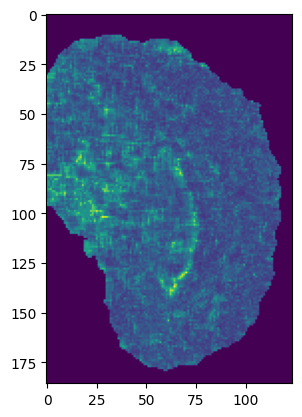

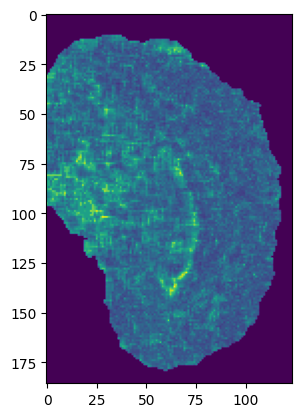

glszm_ZonePercentage


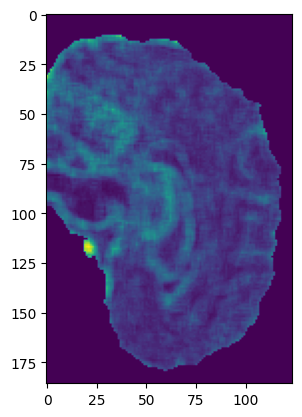

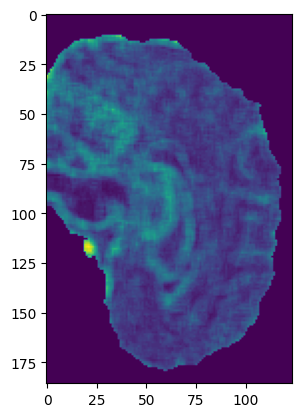

glszm_GrayLevelVariance


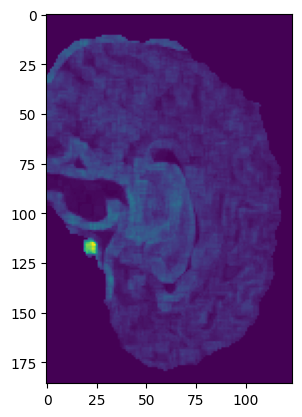

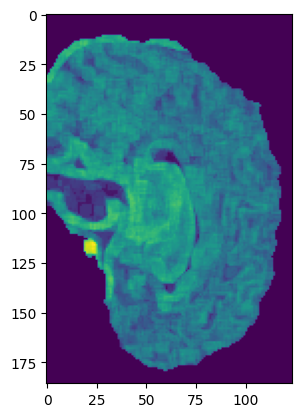

glszm_ZoneVariance


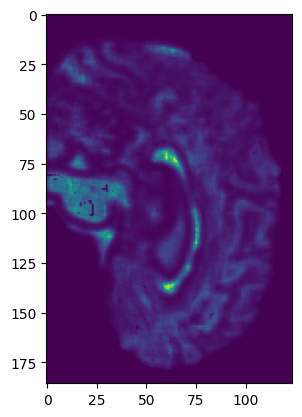

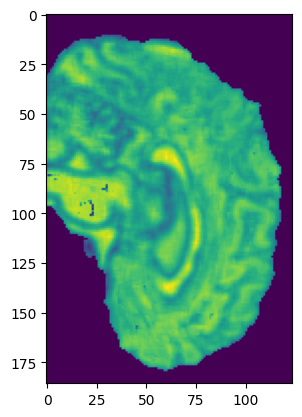

glszm_ZoneEntropy


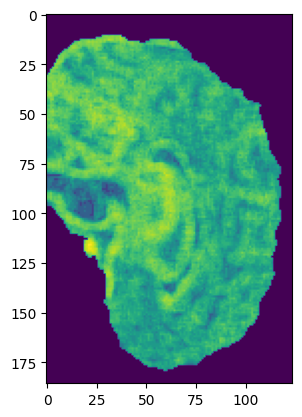

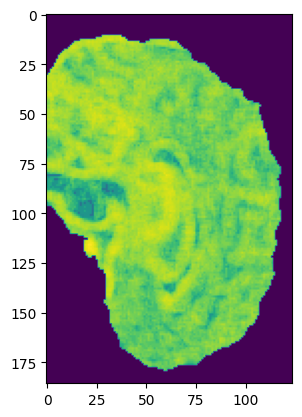

glszm_LowGrayLevelZoneEmphasis


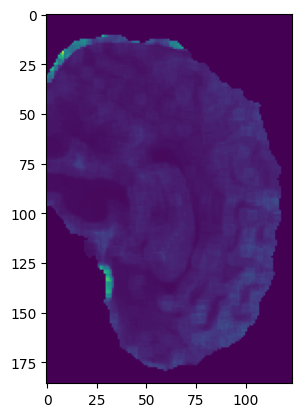

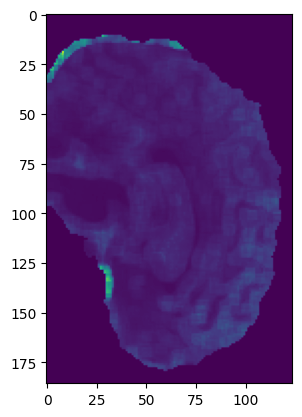

glszm_HighGrayLevelZoneEmphasis


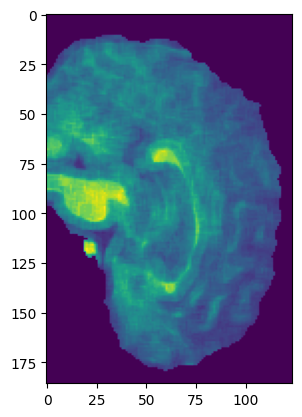

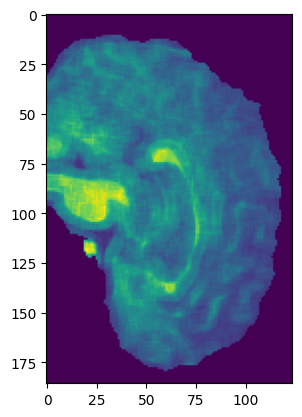

glszm_SmallAreaLowGrayLevelEmphasis


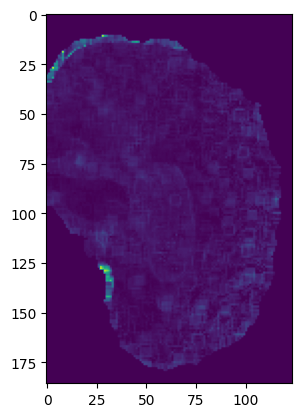

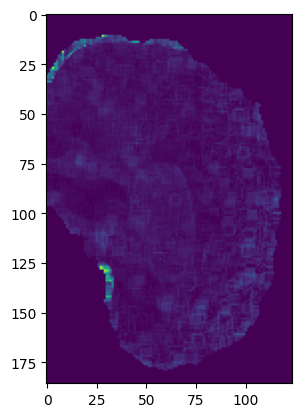

glszm_SmallAreaHighGrayLevelEmphasis


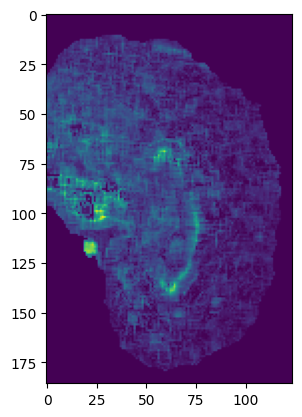

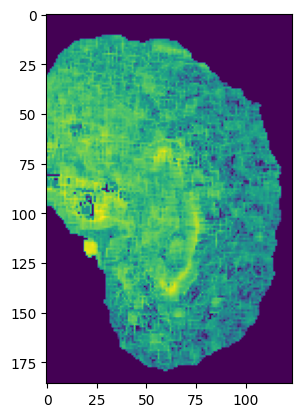

glszm_LargeAreaLowGrayLevelEmphasis


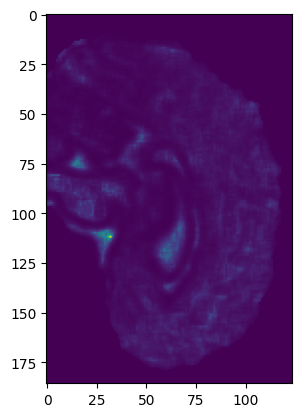

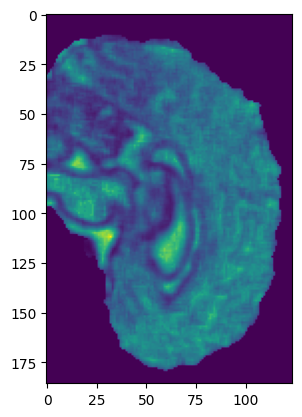

glszm_LargeAreaHighGrayLevelEmphasis


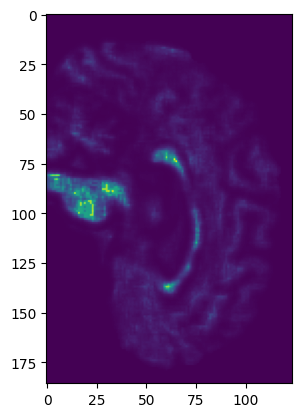

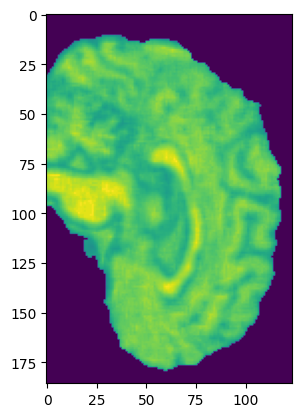

glrlm_ShortRunEmphasis


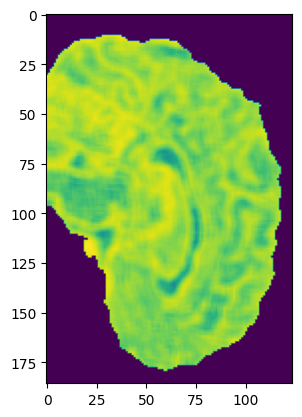

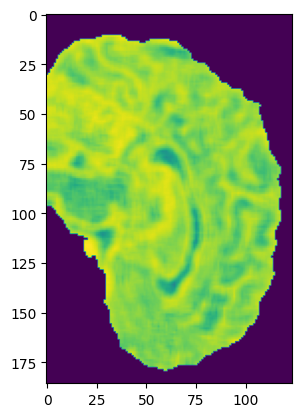

glrlm_LongRunEmphasis


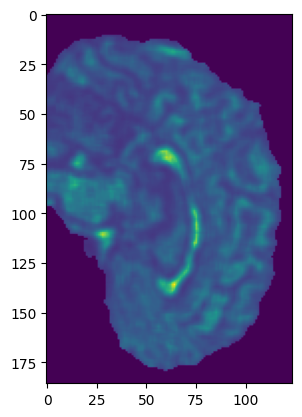

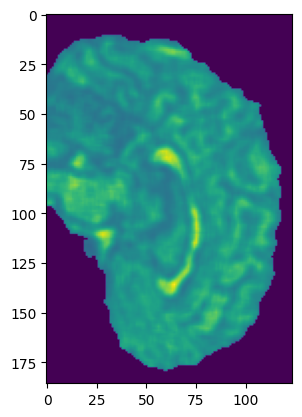

glrlm_GrayLevelNonUniformity


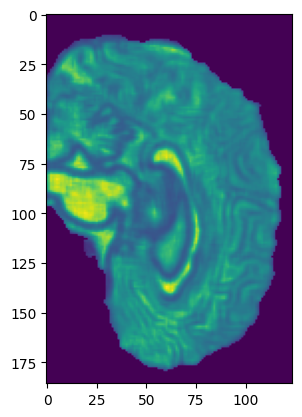

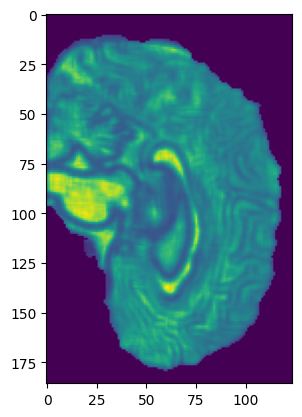

glrlm_GrayLevelNonUniformityNormalized


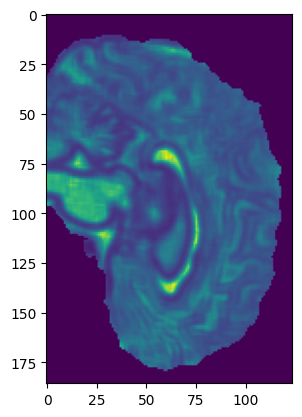

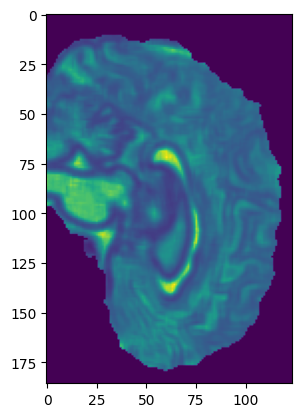

glrlm_RunLengthNonUniformity


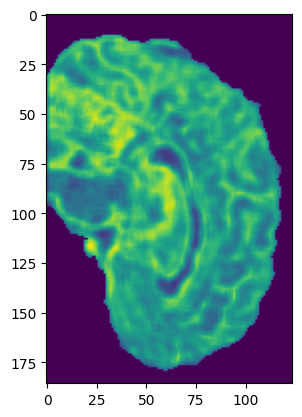

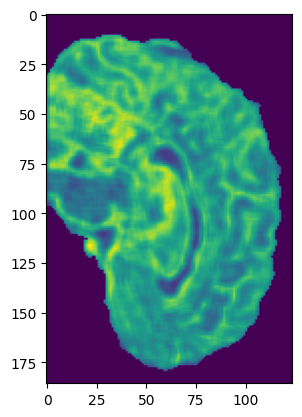

glrlm_RunLengthNonUniformityNormalized


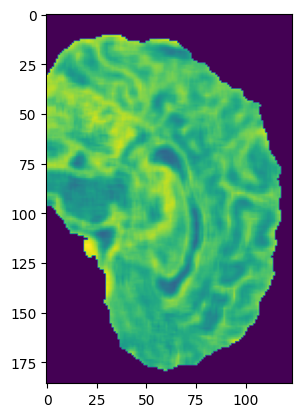

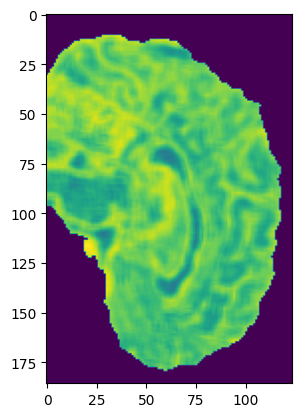

glrlm_RunPercentage


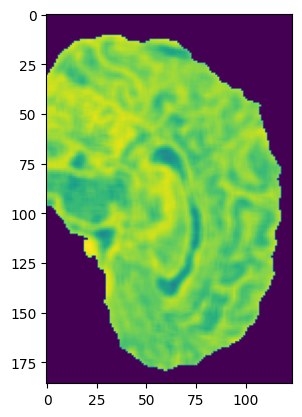

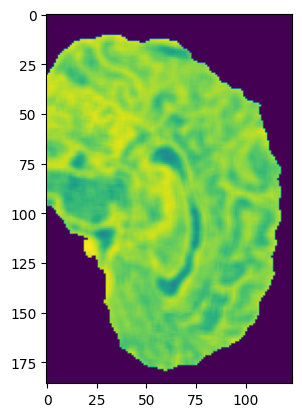

glrlm_GrayLevelVariance


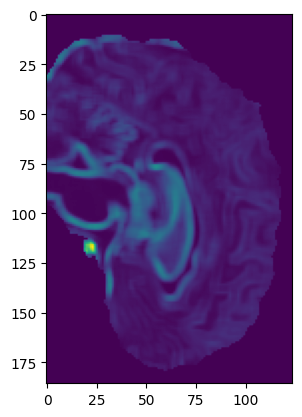

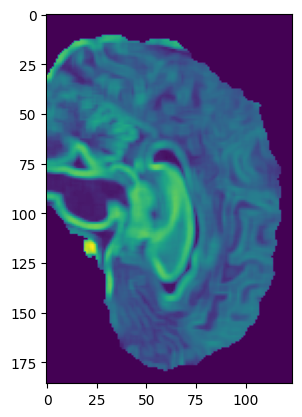

glrlm_RunVariance


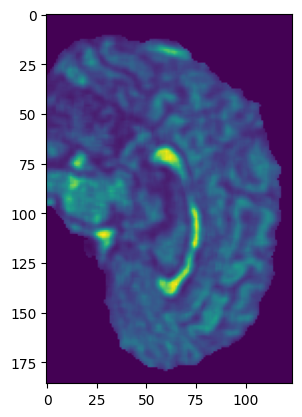

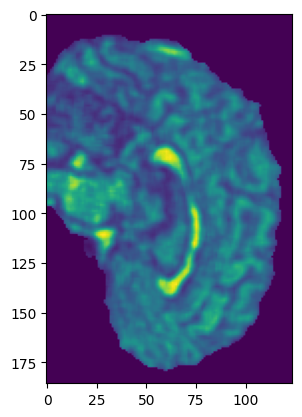

glrlm_RunEntropy


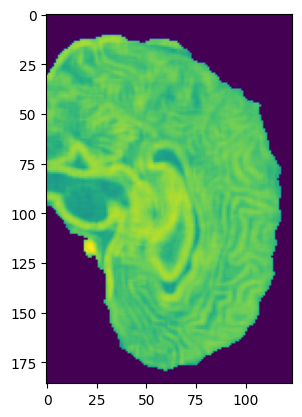

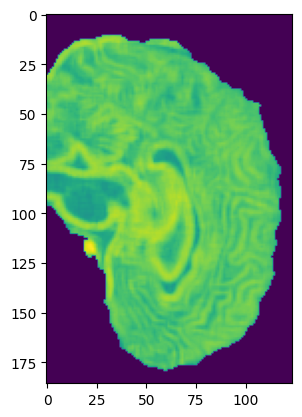

glrlm_LowGrayLevelRunEmphasis


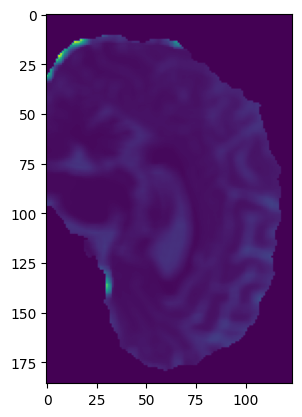

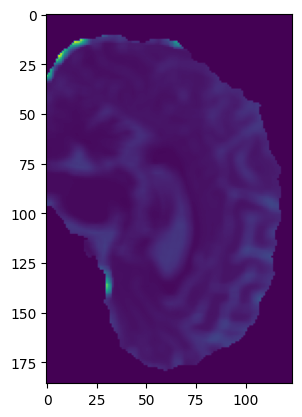

glrlm_HighGrayLevelRunEmphasis


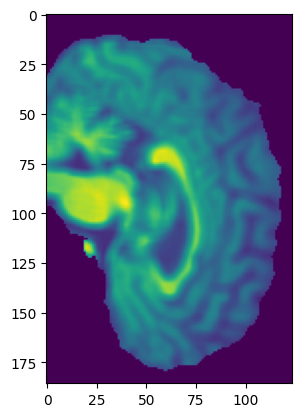

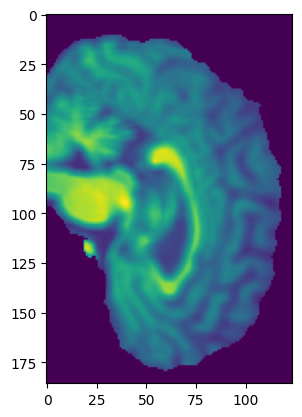

glrlm_ShortRunLowGrayLevelEmphasis


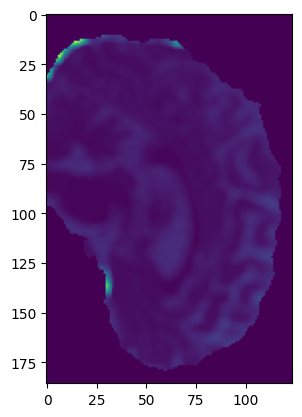

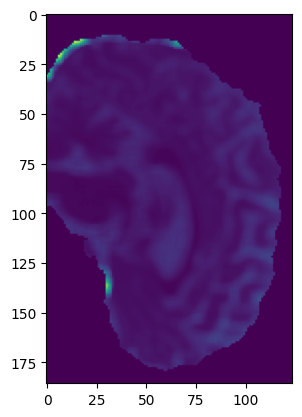

glrlm_ShortRunHighGrayLevelEmphasis


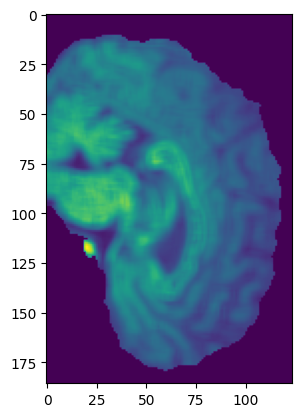

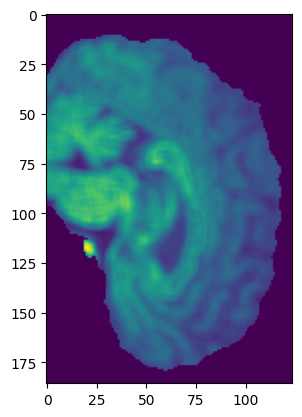

glrlm_LongRunLowGrayLevelEmphasis


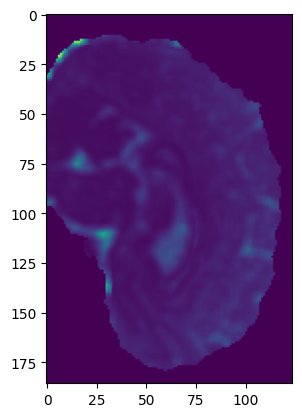

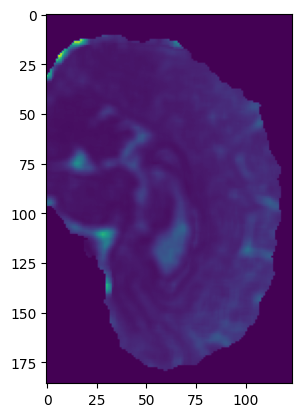

glrlm_LongRunHighGrayLevelEmphasis


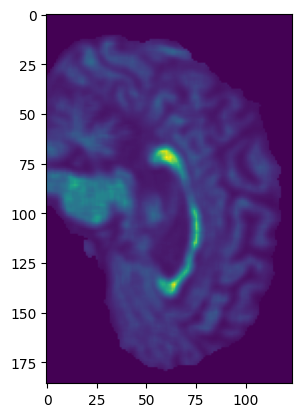

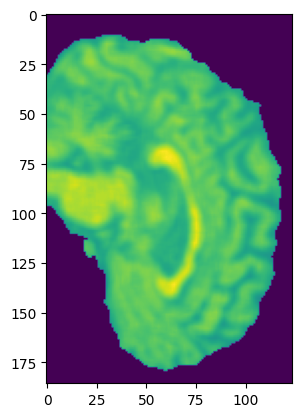

ngtdm_Coarseness


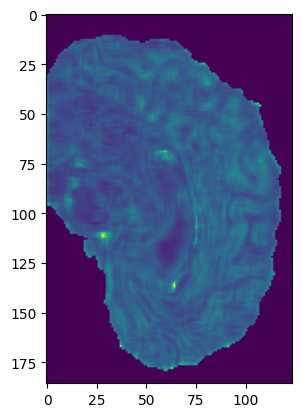

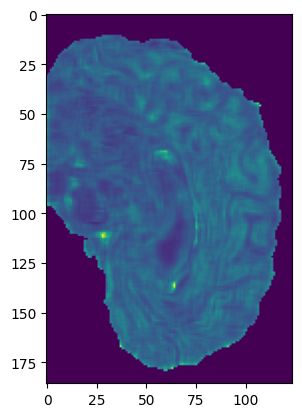

ngtdm_Contrast


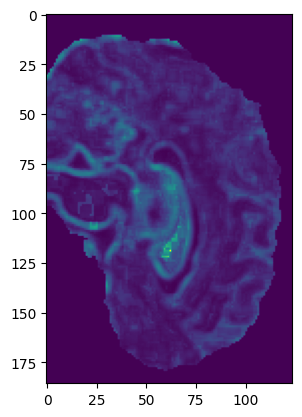

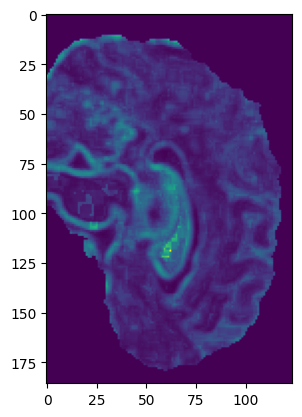

ngtdm_Busyness


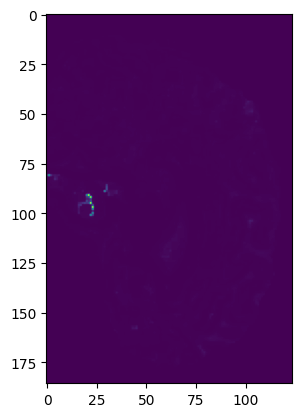

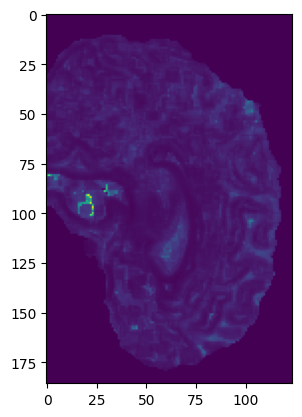

ngtdm_Complexity


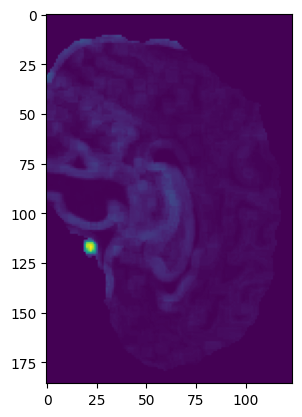

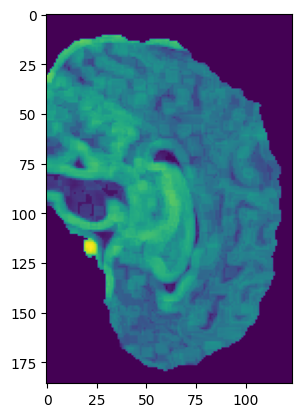

ngtdm_Strength


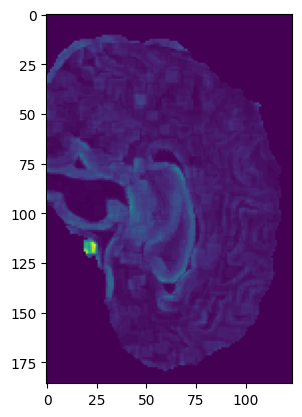

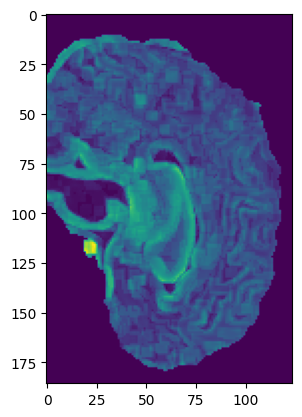

gldm_SmallDependenceEmphasis


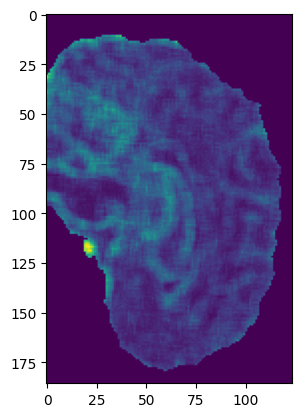

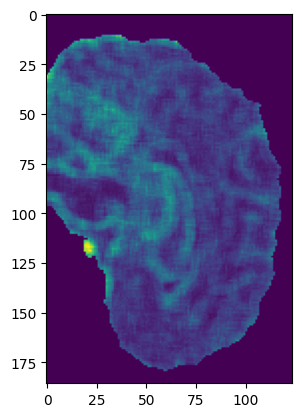

gldm_LargeDependenceEmphasis


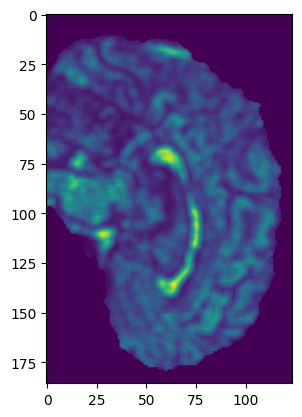

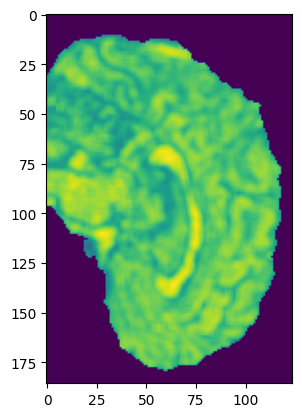

gldm_GrayLevelNonUniformity


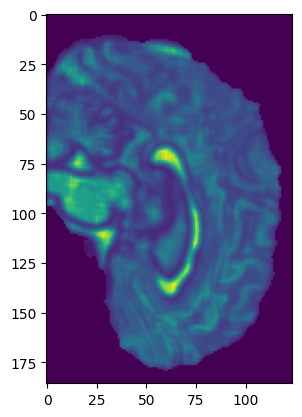

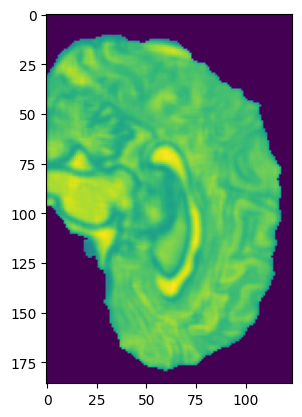

gldm_DependenceNonUniformity


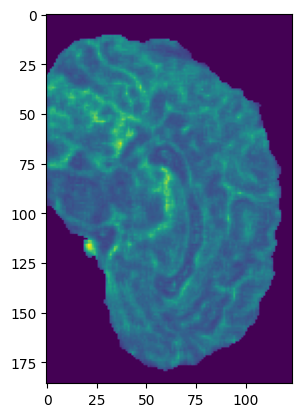

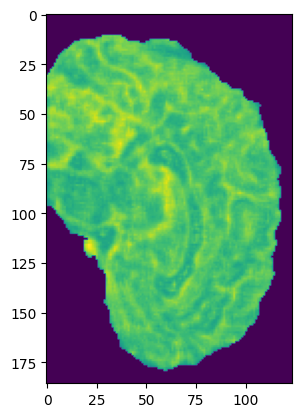

gldm_DependenceNonUniformityNormalized


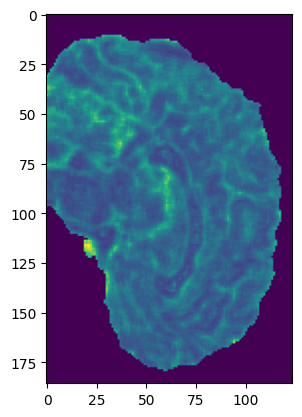

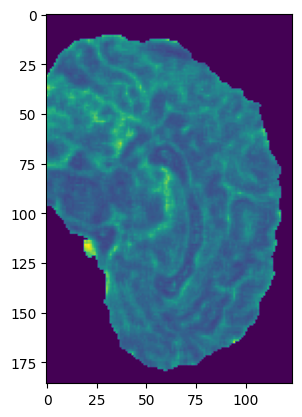

gldm_GrayLevelVariance


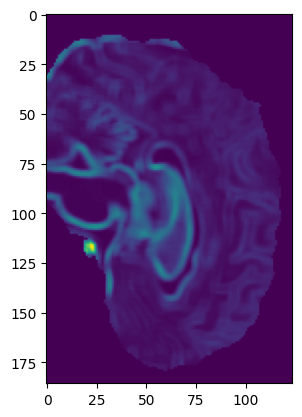

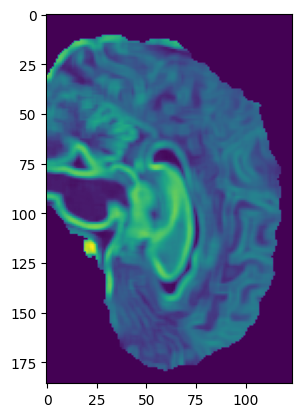

gldm_DependenceVariance


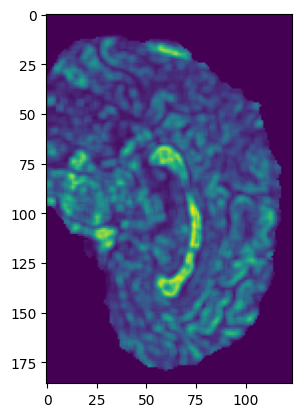

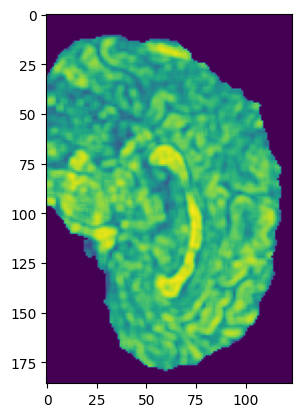

gldm_DependenceEntropy


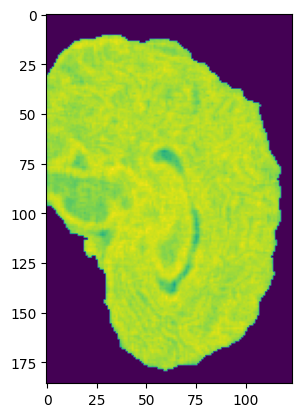

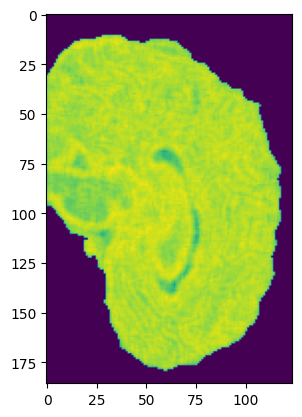

gldm_LowGrayLevelEmphasis


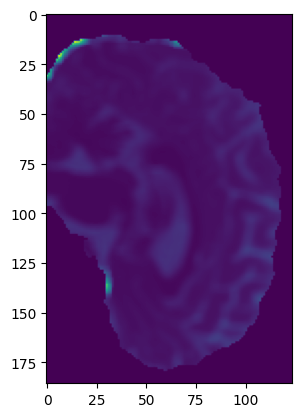

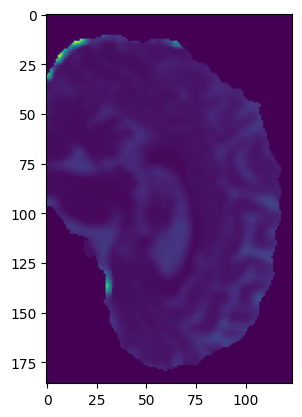

gldm_HighGrayLevelEmphasis


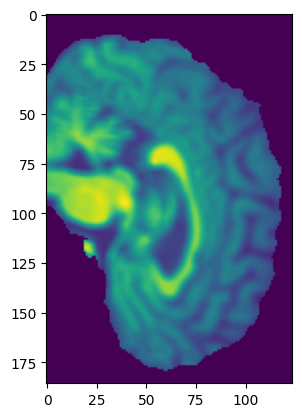

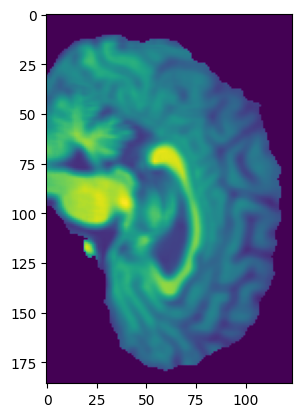

gldm_SmallDependenceLowGrayLevelEmphasis


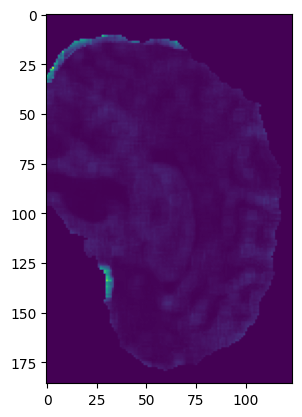

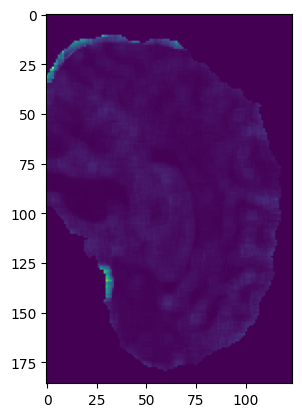

gldm_SmallDependenceHighGrayLevelEmphasis


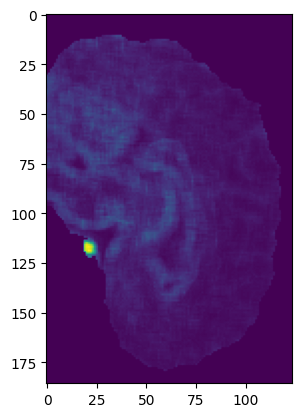

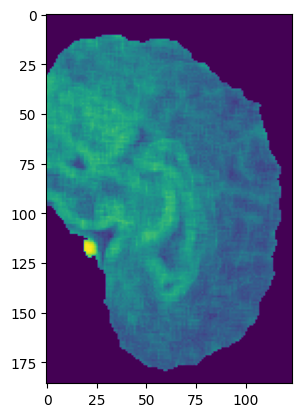

gldm_LargeDependenceLowGrayLevelEmphasis


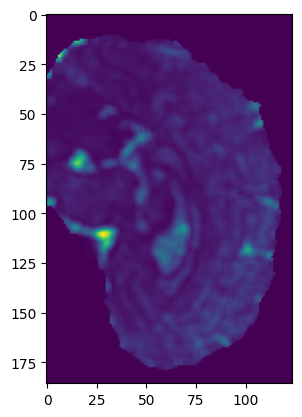

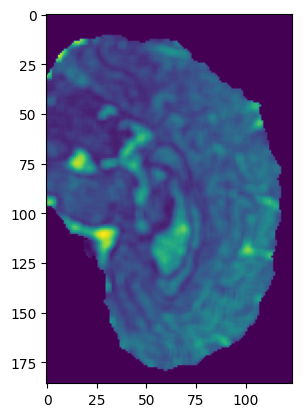

gldm_LargeDependenceHighGrayLevelEmphasis


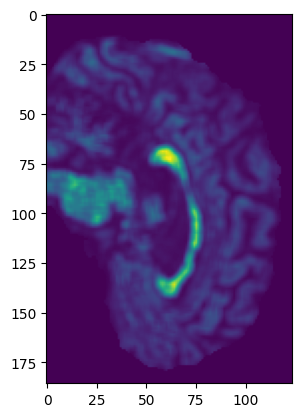

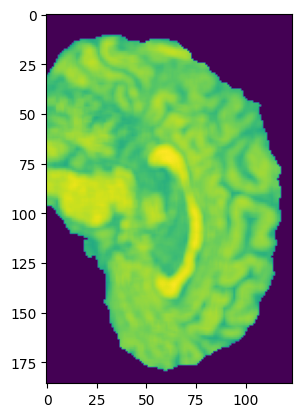

In [10]:
for i in range(len(features)):
    print(features[i])
    plt.imshow(radiomics[0,radiomics.shape[1]//2,:,:,i])
    plt.show()
    plt.imshow(scaled[0,scaled.shape[1]//2,:,:,i])
    plt.show()

In [11]:
del radiomics
del scaled

In [12]:
t1      = np.load('data/preprocessed/t1.npy')
t1_mask = np.load('data/preprocessed/t1_mask.npy')
roi     = np.load('data/preprocessed/roi.npy')
targets = np.load('data/preprocessed/targets.npy')
print('Records: {}\nRAM:     {}GB\n================='.format(len(t1),round(psutil.Process().memory_info().rss/1024**3,1)))
for d in [t1,t1_mask,roi,targets]:
    printProperties(d)

Records: 1
RAM:     0.3GB
(1, 150, 186, 124, 1)
float16


MANY! 0.0-629.0
(1, 150, 186, 124, 1)
bool
{False: 1921304, True: 1538296}
(1, 150, 186, 124, 2)
bool
{False: 6887788, True: 31412}
(1, 150, 186, 124, 14)
bool


{False: 47756931, True: 677469}


In [14]:
tmp = time.time()
radiomics_brain  , features, = extractFeaturesMulti(t1, t1_mask, extractor_params, voxelBased=False)
radiomics_roi    , _       , = extractFeaturesMulti(t1, roi    , extractor_params, voxelBased=False)
radiomics_targets, _       , = extractFeaturesMulti(t1, targets, extractor_params, voxelBased=False)
print('Records: {}\nRAM:     {}GB\nTime:    {}s\n================='.format(len(t1),round(psutil.Process().memory_info().rss/1024**3,1),round(time.time()-tmp)))
#print output raw props
for d in [radiomics_brain,radiomics_roi,radiomics_targets]:
    printProperties(d)
#save raw output
np.save('data/preprocessed/radiomics_brain_raw'  , radiomics_brain)
np.save('data/preprocessed/radiomics_roi_raw'    , radiomics_roi)
np.save('data/preprocessed/radiomics_targets_raw', radiomics_targets)
#scale features
radiomics_brain,radiomics_roi,radiomics_targets = scaleRadiomics2([radiomics_brain,radiomics_roi,radiomics_targets],features)
#print output scaled props
for d in [radiomics_brain,radiomics_roi,radiomics_targets]:
    printProperties(d)
#save scaled output
np.save('data/preprocessed/radiomics_brain'   , radiomics_brain)
np.save('data/preprocessed/radiomics_roi'     , radiomics_roi)
np.save('data/preprocessed/radiomics_targets' , radiomics_targets)
np.save('data/preprocessed/radiomics_features', features)

Records: 1
RAM:     0.4GB
Time:    36s
(1, 106, 1)
float64
MANY! -62.98867748339759-79581700189.0
(1, 106, 2)
float64
MANY! -69.83253350169763-1078755564.0
(1, 106, 14)
float64
MANY! -123.72048742640891-4799594982.0
(1, 106, 1)
float16
MANY! 0.0-1.0
(1, 106, 2)
float16
MANY! 0.0-1.0
(1, 106, 14)
float16
MANY! 0.0-1.0
